In [ ]:
# Install library khusus Face Recognition & Plotting
!pip install facenet-pytorch seaborn matplotlib scikit-learn

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, SubsetRandomSampler
from torchvision import datasets, transforms
from facenet_pytorch import MTCNN, InceptionResnetV1, fixed_image_standardization
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import zipfile
import shutil
from PIL import Image
from tqdm.notebook import tqdm

# Setup Device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


In [ ]:
# ---------------------------------------------------------
# CELL 2 FINAL V2: HEIC SUPPORT & TOTAL CLEANUP
# ---------------------------------------------------------
# 1. INSTALL LIBRARY KHUSUS HEIC (IPHONE)
!pip install pillow-heif

from google.colab import drive
from PIL import Image, ImageOps
import pillow_heif # Library baru untuk baca HEIC
from tqdm.notebook import tqdm
import os
import zipfile
import shutil

# Aktifkan support HEIC agar bisa dibaca Pillow
pillow_heif.register_heif_opener()

# 2. MOUNT DRIVE
drive.mount('/content/drive')

# --- KONFIGURASI ---
ZIP_FILENAME = 'Train.zip'
PATH_ZIP_DI_DRIVE = f'/content/drive/MyDrive/Train.zip'

TEMP_EXTRACT_PATH = '/content/temp_extract'
RAW_DATA_PATH = '/content/raw_dataset'
FINAL_TRAIN_PATH = os.path.join(RAW_DATA_PATH, 'Train')
# Folder yang ingin Anda hapus bersih
PROCESSED_DATA_PATH = '/content/processed_dataset'

# 3. BERSIHKAN SEMUA FOLDER LAMA (RESET TOTAL)
print("Membersihkan folder lama...")
for folder in [TEMP_EXTRACT_PATH, RAW_DATA_PATH, PROCESSED_DATA_PATH]:
    if os.path.exists(folder):
        shutil.rmtree(folder)
        print(f"✔ Dihapus: {folder}")

# Buat folder struktur baru
os.makedirs(TEMP_EXTRACT_PATH)
os.makedirs(FINAL_TRAIN_PATH)

# 4. EKSTRAK ZIP
print(f"\nMenyalin dan Mengekstrak {ZIP_FILENAME}...")
if not os.path.exists(PATH_ZIP_DI_DRIVE):
    raise FileNotFoundError(f"❌ File {ZIP_FILENAME} tidak ditemukan di Drive!")

shutil.copy(PATH_ZIP_DI_DRIVE, '/content/dataset.zip')
with zipfile.ZipFile('/content/dataset.zip', 'r') as zip_ref:
    zip_ref.extractall(TEMP_EXTRACT_PATH)

print("Ekstraksi selesai. Memulai konversi (HEIC/WebP -> JPG)...")

# 5. LOGIKA CARI FOLDER SUMBER
source_root = None
for root, dirs, files in os.walk(TEMP_EXTRACT_PATH):
    if 'Train' in dirs:
        source_root = os.path.join(root, 'Train')
        break

if not source_root:
    source_root = TEMP_EXTRACT_PATH

print(f"Sumber data ditemukan di: {source_root}")

# Statistik
total_files = 0
converted_files = 0
error_files = 0

# 6. LOOP KONVERSI "PENYELAMATAN DATA"
for item in tqdm(os.listdir(source_root), desc="Memproses Mahasiswa"):
    student_source_path = os.path.join(source_root, item)

    if not os.path.isdir(student_source_path): continue
    if item.startswith('.') or item == '__MACOSX': continue

    # Buat folder tujuan
    student_dest_path = os.path.join(FINAL_TRAIN_PATH, item)
    os.makedirs(student_dest_path, exist_ok=True)

    for filename in os.listdir(student_source_path):
        if filename.startswith('.'): continue

        file_path = os.path.join(student_source_path, filename)

        try:
            # BAGIAN INI SEKARANG BISA BACA .HEIC
            img = Image.open(file_path)
            img = img.convert('RGB') # Ubah ke RGB standar
            img = ImageOps.exif_transpose(img) # Fix rotasi HP

            # Simpan ulang sebagai JPG bersih
            clean_name = os.path.splitext(filename)[0] + ".jpg"
            dest_file_path = os.path.join(student_dest_path, clean_name)

            img.save(dest_file_path, 'JPEG', quality=95)

            total_files += 1
            # Hitung file non-jpg yang berhasil diselamatkan
            if not filename.lower().endswith(('.jpg', '.jpeg')):
                converted_files += 1

        except Exception as e:
            # Kalau masih error, berarti file memang rusak (0 bytes / corrupt header)
            print(f"⚠️ File Corrupt (Dibuang): {filename}")
            error_files += 1

# 7. CLEANUP
shutil.rmtree(TEMP_EXTRACT_PATH)
os.remove('/content/dataset.zip')

print("\n" + "="*40)
print("✅ DATASET BERSIH & SIAP")
print("="*40)
print(f"Total Foto Tersimpan : {total_files}")
print(f"Foto Hasil Konversi  : {converted_files} (HEIC/WebP -> JPG)")
print(f"File Corrupt/Dibuang : {error_files}")
print(f"Lokasi Dataset       : {FINAL_TRAIN_PATH}")

Mounted at /content/drive
Membersihkan folder lama...

Menyalin dan Mengekstrak Train.zip...
Ekstraksi selesai. Memulai konversi (HEIC/WebP -> JPG)...
Sumber data ditemukan di: /content/temp_extract/Train


Memproses Mahasiswa:   0%|          | 0/71 [00:00<?, ?it/s]


✅ DATASET BERSIH & SIAP
Total Foto Tersimpan : 284
Foto Hasil Konversi  : 18 (HEIC/WebP -> JPG)
File Corrupt/Dibuang : 0
Lokasi Dataset       : /content/raw_dataset/Train


In [ ]:
import os

# Lokasi Folder Mahasiswa
train_root = '/content/raw_dataset/Train'

# Kata kunci nama mahasiswa (sesuai request Anda)
target_keyword = "Joshua"

print(f"Mencari folder mahasiswa yang mengandung nama '{target_keyword}'...")

found_folder = None

# 1. Cari Folder Joshua yang Tepat
if os.path.exists(train_root):
    for folder_name in os.listdir(train_root):
        # Cari yang namanya mirip "Joshua" (case insensitive)
        if target_keyword.lower() in folder_name.lower():
            found_folder = folder_name
            break

if found_folder:
    full_path = os.path.join(train_root, found_folder)
    print(f"✅ Folder ditemukan: {found_folder}")

    # 2. Ambil semua file foto di dalamnya
    # Kita sort (urutkan) supaya penghapusannya konsisten
    files = sorted([f for f in os.listdir(full_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])

    jumlah_awal = len(files)
    print(f"   Jumlah foto saat ini: {jumlah_awal}")

    if jumlah_awal > 4:
        # 3. Hitung berapa yang harus dihapus
        jumlah_hapus = jumlah_awal - 4
        print(f"   ⚠️ Kelebihan {jumlah_hapus} foto. Menghapus agar sisa 4...")

        # Ambil file dari indeks ke-4 sampai terakhir untuk dihapus
        # (File index 0, 1, 2, 3 akan AMAN/Disimpan)
        files_to_delete = files[4:]

        for filename in files_to_delete:
            file_path = os.path.join(full_path, filename)
            os.remove(file_path) # Hapus File
            print(f"      🗑️ Menghapus: {filename}")

        print(f"\n✅ Selesai! Sekarang {found_folder} memiliki 4 foto pas.")

    elif jumlah_awal == 4:
        print("   ✅ Jumlah sudah pas 4. Tidak ada yang dihapus.")
    else:
        print(f"   ⚠️ Jumlah foto kurang dari 4 ({jumlah_awal}). Tidak ada yang dihapus.")

else:
    print(f"❌ Folder dengan nama '{target_keyword}' tidak ditemukan di {train_root}")

Mencari folder mahasiswa yang mengandung nama 'Joshua'...
✅ Folder ditemukan: Joshua Palti Sinaga
   Jumlah foto saat ini: 8
   ⚠️ Kelebihan 4 foto. Menghapus agar sisa 4...
      🗑️ Menghapus: 17639758210023235490372240672195 - Joshua Palti Sinaga.jpg
      🗑️ Menghapus: 17639758479068663603289950517611 - Joshua Palti Sinaga.jpg
      🗑️ Menghapus: 17639758631535796552761837419873 - Joshua Palti Sinaga.jpg
      🗑️ Menghapus: 17639758911794647128825308284323 - Joshua Palti Sinaga.jpg

✅ Selesai! Sekarang Joshua Palti Sinaga memiliki 4 foto pas.


In [ ]:
# ---------------------------------------------------------
# CELL 3: PREPROCESSING (GENERATE DATASET BERSIH)
# ---------------------------------------------------------
from PIL import Image, ImageOps
from facenet_pytorch import MTCNN
import shutil
import os
import torch # <--- Tambahan Wajib
from tqdm.notebook import tqdm

# 1. SETUP DEVICE (Supaya tidak NameError lagi)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Menggunakan device: {device}")

# 2. BERSIHKAN OUTPUT LAMA
if os.path.exists(PROCESSED_DATA_PATH):
    shutil.rmtree(PROCESSED_DATA_PATH)
os.makedirs(PROCESSED_DATA_PATH)

# 3. LOKASI SUMBER DATA
real_root = os.path.join(RAW_DATA_PATH, 'Train')

print(f"Membaca data dari: {real_root}\n")

if not os.path.exists(real_root):
    raise ValueError(f"❌ Error: Folder {real_root} tidak ditemukan! Pastikan Cell 2 sukses.")

# 4. KONFIGURASI MTCNN
mtcnn = MTCNN(
    image_size=160, margin=20, min_face_size=20,
    thresholds=[0.6, 0.7, 0.7], keep_all=False, select_largest=True,
    post_process=False, device=device
)

# Variabel Laporan
success_total = 0
fail_no_face = 0
fail_corrupt = 0
students_processed = 0

# 5. LOOPING FOLDER MAHASISWA
student_folders = sorted(os.listdir(real_root))

for class_name in tqdm(student_folders, desc="Memproses Wajah"):
    # Abaikan file sampah sistem
    if class_name.startswith('.') or class_name == '__MACOSX': continue

    student_path = os.path.join(real_root, class_name)
    if not os.path.isdir(student_path): continue

    # Buat folder output
    save_dir = os.path.join(PROCESSED_DATA_PATH, class_name)
    if not os.path.exists(save_dir): os.makedirs(save_dir)

    # Ambil file gambar
    files_in_folder = sorted([f for f in os.listdir(student_path) if not f.startswith('.')])

    if len(files_in_folder) == 0:
        os.rmdir(save_dir)
        continue

    folder_success = 0
    students_processed += 1

    for filename in files_in_folder:
        path = os.path.join(student_path, filename)
        save_path = os.path.join(save_dir, f'{class_name}_{folder_success}.jpg')

        try:
            # A. Buka Gambar & Fix Rotasi
            img = Image.open(path).convert('RGB')
            img = ImageOps.exif_transpose(img)

            # B. Deteksi Wajah
            result = mtcnn(img, save_path=save_path)

            if result is not None:
                folder_success += 1
                success_total += 1
            else:
                print(f"   ❌ [WAJAH HILANG] {class_name}/{filename}")
                fail_no_face += 1

        except Exception as e:
            print(f"   ☠️ [FILE CORRUPT] {class_name}/{filename} -> {e}")
            fail_corrupt += 1

    # Cek jika folder kosong
    if folder_success == 0:
        print(f"   🔴 PERINGATAN: {class_name} kehilangan semua foto!")
        os.rmdir(save_dir)

print("\n" + "="*40)
print("LAPORAN AKHIR PREPROCESSING")
print("="*40)
print(f"Jumlah Mahasiswa          : {students_processed}")
print(f"Target Ideal (70 x 4)     : 280 Foto")
print(f"----------------------------------------")
print(f"✅ Wajah Berhasil Crop    : {success_total}")
print(f"❌ Gagal Deteksi Wajah    : {fail_no_face}")
print(f"☠️ File Rusak             : {fail_corrupt}")
print(f"📂 Lokasi Output          : {PROCESSED_DATA_PATH}")

Menggunakan device: cuda
Membaca data dari: /content/raw_dataset/Train



Memproses Wajah:   0%|          | 0/70 [00:00<?, ?it/s]

   ❌ [WAJAH HILANG] Muhammad Nelwan Fakhri /20251124_183233 - Muhammad Nelwan Fakhri.jpg

LAPORAN AKHIR PREPROCESSING
Jumlah Mahasiswa          : 70
Target Ideal (70 x 4)     : 280 Foto
----------------------------------------
✅ Wajah Berhasil Crop    : 279
❌ Gagal Deteksi Wajah    : 1
☠️ File Rusak             : 0
📂 Lokasi Output          : /content/processed_dataset


In [ ]:
# CELL 4: DATA LOADER DENGAN CUSTOM SPLIT

from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from facenet_pytorch import fixed_image_standardization
import numpy as np
import torch
from collections import defaultdict

print("Menyiapkan Data Loader dengan Custom Splitting...")

# 1. DEFINISI TRANSFORMASI
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=10), # Rotasi sedikit lebih berani
        transforms.ColorJitter(brightness=0.1, contrast=0.1),
        transforms.ToTensor(),
        fixed_image_standardization
    ]),
    'test': transforms.Compose([
        transforms.ToTensor(),
        fixed_image_standardization
    ]),
}

# 2. LOAD DATASET
full_dataset = datasets.ImageFolder(PROCESSED_DATA_PATH)
if len(full_dataset) == 0:
    raise ValueError("ERROR: Dataset Kosong!")

class_names = full_dataset.classes
print(f"Total Foto: {len(full_dataset)}")
print(f"Total Mahasiswa: {len(class_names)}")

# ---------------------------------------------------------
# 3. LOGIKA PEMBAGIAN MANUAL (CUSTOM SPLIT)
# ---------------------------------------------------------
# Kita kelompokkan dulu: Mahasiswa A punya foto nomor berapa saja?
class_indices = defaultdict(list)

for idx, (_, class_id) in enumerate(full_dataset.samples):
    class_indices[class_id].append(idx)

train_idx = []
test_idx = []
skipped_test_count = 0

print("\n--- Rincian Pembagian Data ---")

for class_id, indices in class_indices.items():
    student_name = class_names[class_id]
    n_samples = len(indices)

    # Acak urutan foto agar tidak selalu foto terakhir yang jadi test
    np.random.shuffle(indices)

    if n_samples >= 2:
        # KASUS NORMAL: Ada minimal 2 foto
        # 1 Foto masuk TEST, Sisanya masuk TRAIN
        test_idx.append(indices[0])      # Ambil 1 untuk Test
        train_idx.extend(indices[1:])    # Sisanya untuk Train
    elif n_samples == 1:
        # KASUS KRITIS: Cuma sisa 1 foto
        # Masuk Train semua (agar model kenal). Tidak bisa diuji.
        train_idx.extend(indices)
        skipped_test_count += 1
        print(f"⚠️ [CUMA 1 FOTO] {student_name}: Masuk Training semua.")

print("-" * 30)
print(f"Total Data Training : {len(train_idx)} foto")
print(f"Total Data Testing  : {len(test_idx)} foto")
print(f"Mahasiswa tanpa Data Test: {skipped_test_count} orang")

# 4. WRAPPER CLASS (Agar Train kena Augmentasi, Test tidak)
class TransformedSubset(Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform
    def __getitem__(self, index):
        x, y = self.subset[index]
        if self.transform:
            x = self.transform(x)
        return x, y
    def __len__(self):
        return len(self.subset)

# Buat Subset berdasarkan index yang sudah kita pilih manual
train_subset = torch.utils.data.Subset(full_dataset, train_idx)
test_subset = torch.utils.data.Subset(full_dataset, test_idx)

# Apply Transform
train_data = TransformedSubset(train_subset, transform=data_transforms['train'])
test_data = TransformedSubset(test_subset, transform=data_transforms['test'])

# 5. DATALOADER
BATCH_SIZE = 32
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
test_loader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print("\nData Loader Siap! Setiap mahasiswa (yg punya >1 foto) pasti ada di Training dan Testing.")

Menyiapkan Data Loader dengan Custom Splitting...
Total Foto: 279
Total Mahasiswa: 70

--- Rincian Pembagian Data ---
------------------------------
Total Data Training : 209 foto
Total Data Testing  : 70 foto
Mahasiswa tanpa Data Test: 0 orang

Data Loader Siap! Setiap mahasiswa (yg punya >1 foto) pasti ada di Training dan Testing.


In [ ]:
# TRAINING CLASSIFIER (WITH IMPORTS)

from facenet_pytorch import InceptionResnetV1
import torch
import torch.nn as nn
import torch.optim as optim
import copy
import time
from tqdm.notebook import tqdm

print("=== TRAINING START: Classifier Only (Backbone Frozen) ===")

# 2. SETUP MODEL
# Pastikan device terdefinisi
if 'device' not in locals():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Device: {device}")

# Load FaceNet Pretrained (VGGFace2)
model = InceptionResnetV1(pretrained='vggface2', classify=True).to(device)

# --- KONSEP UTAMA: FREEZE BACKBONE ---
# Kita kunci semua bobot model agar tidak rusak
for param in model.parameters():
    param.requires_grad = False

# Kita ganti Layer Terakhir (Head) sesuai jumlah mahasiswa Anda
# Layer baru ini otomatis Unfrozen (bisa dilatih)
# Pastikan 'class_names' ada. Jika error, jalankan Cell 4 dulu.
if 'class_names' not in locals():
     raise NameError("Variabel 'class_names' hilang. Harap jalankan Cell 4 (Data Loader) dulu.")

model.logits = nn.Linear(model.logits.in_features, len(class_names)).to(device)

# 3. CONFIG (Loss, Optimizer, Scheduler)
criterion = nn.CrossEntropyLoss()
# Hanya latih parameter di layer terakhir (model.logits)
optimizer = optim.Adam(model.logits.parameters(), lr=0.001)
# Turunkan LR jika akurasi mentok (biar makin presisi)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)

# 4. FUNGSI TRAINING "SMART" (Save Best Model)
def train_save_best(model, criterion, optimizer, scheduler, train_loader, val_loader, num_epochs=25):
    since = time.time()

    # Siapkan variabel untuk menyimpan model terbaik
    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf') # Mulai dengan loss tak terhingga
    best_acc = 0.0

    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        # --- FASE TRAINING ---
        model.train()
        run_loss = 0.0
        run_corrects = 0

        for inputs, labels in tqdm(train_loader, desc="Training", leave=False):
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)

            loss.backward()
            optimizer.step()

            run_loss += loss.item() * inputs.size(0)
            run_corrects += torch.sum(preds == labels.data)

        epoch_loss = run_loss / len(train_loader.dataset)
        epoch_acc = run_corrects.double() / len(train_loader.dataset)

        # --- FASE VALIDASI (TESTING) ---
        model.eval()
        val_loss = 0.0
        val_corrects = 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                loss = criterion(outputs, labels)
                _, preds = torch.max(outputs, 1)

                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(preds == labels.data)

        val_epoch_loss = val_loss / len(val_loader.dataset)
        val_epoch_acc = val_corrects.double() / len(val_loader.dataset)

        # Update Scheduler
        if scheduler:
            scheduler.step(val_epoch_loss)

        print(f"Train Loss: {epoch_loss:.4f} | Acc: {epoch_acc:.4f}")
        print(f"Val   Loss: {val_epoch_loss:.4f} | Acc: {val_epoch_acc:.4f}")

        # Simpan History
        history['train_loss'].append(epoch_loss)
        history['val_loss'].append(val_epoch_loss)
        history['val_acc'].append(val_epoch_acc.item())

        # --- LOGIKA CHECKPOINT ---
        # Jika Loss Validasi turun, berarti model makin bagus -> SIMPAN
        if val_epoch_loss < best_loss:
            best_loss = val_epoch_loss
            best_acc = val_epoch_acc
            best_model_wts = copy.deepcopy(model.state_dict())

            # Simpan file fisik juga
            torch.save(model.state_dict(), 'checkpoint_best_model.pth')
            print(f"✅ NEW BEST MODEL (Loss: {best_loss:.4f})")
        else:
            print(f"   (No improvement. Best Loss: {best_loss:.4f})")

    time_elapsed = time.time() - since
    print(f'\nTraining complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best Val Acc: {best_acc:.4f}')

    # Load kembali bobot terbaik ke model akhir
    model.load_state_dict(best_model_wts)
    return history

# 5. JALANKAN TRAINING
# Kita set 30 Epoch.
history = train_save_best(
    model,
    criterion,
    optimizer,
    scheduler,
    train_loader=train_loader,
    val_loader=test_loader, # Kita pakai data test sebagai validasi
    num_epochs=30
)

=== TRAINING START: Classifier Only (Backbone Frozen) ===


  0%|          | 0.00/107M [00:00<?, ?B/s]


Epoch 1/30
----------


/usr/local/lib/python3.12/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 4.2156 | Acc: 0.0622
Val   Loss: 4.4079 | Acc: 0.0143
✅ NEW BEST MODEL (Loss: 4.4079)

Epoch 2/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 3.4227 | Acc: 0.2967
Val   Loss: 4.5965 | Acc: 0.0143
   (No improvement. Best Loss: 4.4079)

Epoch 3/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 2.7658 | Acc: 0.6172
Val   Loss: 4.8221 | Acc: 0.0143
   (No improvement. Best Loss: 4.4079)

Epoch 4/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 2.2190 | Acc: 0.7990
Val   Loss: 5.0938 | Acc: 0.0143
   (No improvement. Best Loss: 4.4079)

Epoch 5/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.7445 | Acc: 0.8756
Val   Loss: 5.0719 | Acc: 0.0143
   (No improvement. Best Loss: 4.4079)

Epoch 6/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.5069 | Acc: 0.8947
Val   Loss: 4.3936 | Acc: 0.0143
✅ NEW BEST MODEL (Loss: 4.3936)

Epoch 7/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.4722 | Acc: 0.8947
Val   Loss: 3.2690 | Acc: 0.2286
✅ NEW BEST MODEL (Loss: 3.2690)

Epoch 8/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.4422 | Acc: 0.9043
Val   Loss: 2.2974 | Acc: 0.5857
✅ NEW BEST MODEL (Loss: 2.2974)

Epoch 9/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.3917 | Acc: 0.8900
Val   Loss: 1.8892 | Acc: 0.7571
✅ NEW BEST MODEL (Loss: 1.8892)

Epoch 10/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.4044 | Acc: 0.8900
Val   Loss: 1.7528 | Acc: 0.7571
✅ NEW BEST MODEL (Loss: 1.7528)

Epoch 11/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.3531 | Acc: 0.9187
Val   Loss: 1.7069 | Acc: 0.7714
✅ NEW BEST MODEL (Loss: 1.7069)

Epoch 12/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.3085 | Acc: 0.8995
Val   Loss: 1.6852 | Acc: 0.7857
✅ NEW BEST MODEL (Loss: 1.6852)

Epoch 13/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.2453 | Acc: 0.9187
Val   Loss: 1.6555 | Acc: 0.7857
✅ NEW BEST MODEL (Loss: 1.6555)

Epoch 14/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.2812 | Acc: 0.9234
Val   Loss: 1.6379 | Acc: 0.7714
✅ NEW BEST MODEL (Loss: 1.6379)

Epoch 15/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.2768 | Acc: 0.9139
Val   Loss: 1.6254 | Acc: 0.7857
✅ NEW BEST MODEL (Loss: 1.6254)

Epoch 16/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.2080 | Acc: 0.9426
Val   Loss: 1.5892 | Acc: 0.8000
✅ NEW BEST MODEL (Loss: 1.5892)

Epoch 17/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.1553 | Acc: 0.9282
Val   Loss: 1.5722 | Acc: 0.7714
✅ NEW BEST MODEL (Loss: 1.5722)

Epoch 18/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.1992 | Acc: 0.9043
Val   Loss: 1.5475 | Acc: 0.8000
✅ NEW BEST MODEL (Loss: 1.5475)

Epoch 19/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.1673 | Acc: 0.9091
Val   Loss: 1.5264 | Acc: 0.8143
✅ NEW BEST MODEL (Loss: 1.5264)

Epoch 20/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.1375 | Acc: 0.9234
Val   Loss: 1.5036 | Acc: 0.8000
✅ NEW BEST MODEL (Loss: 1.5036)

Epoch 21/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.1183 | Acc: 0.9139
Val   Loss: 1.4808 | Acc: 0.8143
✅ NEW BEST MODEL (Loss: 1.4808)

Epoch 22/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.0814 | Acc: 0.9426
Val   Loss: 1.4659 | Acc: 0.8286
✅ NEW BEST MODEL (Loss: 1.4659)

Epoch 23/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.0850 | Acc: 0.9665
Val   Loss: 1.4470 | Acc: 0.8143
✅ NEW BEST MODEL (Loss: 1.4470)

Epoch 24/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 1.0366 | Acc: 0.9330
Val   Loss: 1.4186 | Acc: 0.8143
✅ NEW BEST MODEL (Loss: 1.4186)

Epoch 25/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.9785 | Acc: 0.9282
Val   Loss: 1.4061 | Acc: 0.8143
✅ NEW BEST MODEL (Loss: 1.4061)

Epoch 26/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.9704 | Acc: 0.9617
Val   Loss: 1.3897 | Acc: 0.8143
✅ NEW BEST MODEL (Loss: 1.3897)

Epoch 27/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.9770 | Acc: 0.9474
Val   Loss: 1.3889 | Acc: 0.8000
✅ NEW BEST MODEL (Loss: 1.3889)

Epoch 28/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.9638 | Acc: 0.9474
Val   Loss: 1.3781 | Acc: 0.8143
✅ NEW BEST MODEL (Loss: 1.3781)

Epoch 29/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.9554 | Acc: 0.9569
Val   Loss: 1.3616 | Acc: 0.8143
✅ NEW BEST MODEL (Loss: 1.3616)

Epoch 30/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.9165 | Acc: 0.9713
Val   Loss: 1.3461 | Acc: 0.8143
✅ NEW BEST MODEL (Loss: 1.3461)

Training complete in 1m 19s
Best Val Acc: 0.8143


In [ ]:
# ---------------------------------------------------------
# CELL 6B: SOFT FINE-TUNING (MENURUNKAN LOSS)
# ---------------------------------------------------------
print("=== PHASE 2: Soft Fine-Tuning (Melanjutkan Training) ===")

# 1. LOAD MODEL TERBAIK DARI PHASE 1
# Kita pastikan kita lanjut dari titik terbaik (Epoch 30 tadi)
try:
    model.load_state_dict(torch.load('checkpoint_best_model.pth'))
    print("✅ Memuat bobot terbaik dari Phase 1.")
except:
    print("⚠️ Warning: Tidak menemukan checkpoint, menggunakan model terakhir di memori.")

# 2. STRATEGI UNFREEZE SELEKTIF (KUNCI ANTI-OVERFITTING)
# Kita freeze dulu semuanya
for param in model.parameters():
    param.requires_grad = False

# Kita hanya cairkan Blok Terakhir FaceNet (Block8)
# Ini membiarkan model beradaptasi dengan lighting foto mahasiswa
# tanpa merusak pengetahuan dasarnya.
for name, param in model.named_parameters():
    if "logits" in name: # Layer klasifikasi (Pasti unfreeze)
        param.requires_grad = True
    elif "repeat_3" in name or "mixed_7a" in name: # Blok terakhir InceptionResnet
        param.requires_grad = True
        # print(f"Unfrozen: {name}") # Uncomment untuk cek layer

# 3. CONFIG BARU (Learning Rate Lebih Kecil)
# LR diturunkan drastis ke 1e-4 atau 1e-5 agar perubahannya halus
optimizer_ft = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4)

# Scheduler tetap dipakai
scheduler_ft = optim.lr_scheduler.ReduceLROnPlateau(optimizer_ft, mode='min', factor=0.1, patience=3, verbose=True)

# 4. JALANKAN TRAINING LANJUTAN (20 Epoch lagi)
print("Memulai Fine-Tuning selama 20 Epoch tambahan...")

# Kita pakai fungsi training yang sama
history_phase2 = train_save_best(
    model,
    criterion,
    optimizer_ft,
    scheduler_ft,
    train_loader=train_loader,
    val_loader=test_loader,
    num_epochs=30
)

=== PHASE 2: Soft Fine-Tuning (Melanjutkan Training) ===
✅ Memuat bobot terbaik dari Phase 1.
Memulai Fine-Tuning selama 20 Epoch tambahan...

Epoch 1/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.9242 | Acc: 0.9474
Val   Loss: 1.4815 | Acc: 0.8000
✅ NEW BEST MODEL (Loss: 1.4815)

Epoch 2/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.6497 | Acc: 0.9904
Val   Loss: 1.4823 | Acc: 0.8143
   (No improvement. Best Loss: 1.4815)

Epoch 3/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.4601 | Acc: 1.0000
Val   Loss: 1.2964 | Acc: 0.8429
✅ NEW BEST MODEL (Loss: 1.2964)

Epoch 4/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.4009 | Acc: 1.0000
Val   Loss: 1.1084 | Acc: 0.8714
✅ NEW BEST MODEL (Loss: 1.1084)

Epoch 5/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.3214 | Acc: 1.0000
Val   Loss: 0.9865 | Acc: 0.8857
✅ NEW BEST MODEL (Loss: 0.9865)

Epoch 6/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.2735 | Acc: 1.0000
Val   Loss: 0.9087 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.9087)

Epoch 7/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.2269 | Acc: 1.0000
Val   Loss: 0.8765 | Acc: 0.9000
✅ NEW BEST MODEL (Loss: 0.8765)

Epoch 8/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.2056 | Acc: 1.0000
Val   Loss: 0.8401 | Acc: 0.8857
✅ NEW BEST MODEL (Loss: 0.8401)

Epoch 9/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.1855 | Acc: 1.0000
Val   Loss: 0.8170 | Acc: 0.8857
✅ NEW BEST MODEL (Loss: 0.8170)

Epoch 10/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.1599 | Acc: 1.0000
Val   Loss: 0.7866 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.7866)

Epoch 11/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.1372 | Acc: 1.0000
Val   Loss: 0.7624 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.7624)

Epoch 12/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.1396 | Acc: 1.0000
Val   Loss: 0.7568 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.7568)

Epoch 13/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.1205 | Acc: 1.0000
Val   Loss: 0.7389 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.7389)

Epoch 14/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.1189 | Acc: 1.0000
Val   Loss: 0.7059 | Acc: 0.9286
✅ NEW BEST MODEL (Loss: 0.7059)

Epoch 15/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.1032 | Acc: 1.0000
Val   Loss: 0.6983 | Acc: 0.9286
✅ NEW BEST MODEL (Loss: 0.6983)

Epoch 16/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.1030 | Acc: 1.0000
Val   Loss: 0.6919 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.6919)

Epoch 17/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0921 | Acc: 1.0000
Val   Loss: 0.6659 | Acc: 0.9000
✅ NEW BEST MODEL (Loss: 0.6659)

Epoch 18/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0842 | Acc: 1.0000
Val   Loss: 0.6458 | Acc: 0.9000
✅ NEW BEST MODEL (Loss: 0.6458)

Epoch 19/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0833 | Acc: 1.0000
Val   Loss: 0.6414 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.6414)

Epoch 20/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0783 | Acc: 1.0000
Val   Loss: 0.6414 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.6414)

Epoch 21/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0782 | Acc: 1.0000
Val   Loss: 0.6403 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.6403)

Epoch 22/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0663 | Acc: 1.0000
Val   Loss: 0.6457 | Acc: 0.9000
   (No improvement. Best Loss: 0.6403)

Epoch 23/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0643 | Acc: 1.0000
Val   Loss: 0.6403 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.6403)

Epoch 24/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0667 | Acc: 1.0000
Val   Loss: 0.6309 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.6309)

Epoch 25/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0621 | Acc: 1.0000
Val   Loss: 0.6284 | Acc: 0.9286
✅ NEW BEST MODEL (Loss: 0.6284)

Epoch 26/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0562 | Acc: 1.0000
Val   Loss: 0.6062 | Acc: 0.9286
✅ NEW BEST MODEL (Loss: 0.6062)

Epoch 27/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0561 | Acc: 1.0000
Val   Loss: 0.6002 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.6002)

Epoch 28/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0541 | Acc: 1.0000
Val   Loss: 0.5926 | Acc: 0.9143
✅ NEW BEST MODEL (Loss: 0.5926)

Epoch 29/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0511 | Acc: 1.0000
Val   Loss: 0.5858 | Acc: 0.9286
✅ NEW BEST MODEL (Loss: 0.5858)

Epoch 30/30
----------


Training:   0%|          | 0/7 [00:00<?, ?it/s]

Train Loss: 0.0479 | Acc: 1.0000
Val   Loss: 0.5715 | Acc: 0.9286
✅ NEW BEST MODEL (Loss: 0.5715)

Training complete in 1m 34s
Best Val Acc: 0.9286


Memulai Evaluasi Menyeluruh pada Data Testing...


Evaluating:   0%|          | 0/3 [00:00<?, ?it/s]


✅ AKURASI FINAL PADA DATA TEST: 92.86%

LAPORAN PER MAHASISWA (Cari yang F1-Score rendah)
                                 precision    recall  f1-score   support

             Nasya Aulia Efendi       0.00      0.00      0.00         1
           Abraham Ganda Napitu       1.00      1.00      1.00         1
       Abu Bakar Siddiq Siregar       1.00      1.00      1.00         1
             Ahmad Faqih Hasani       1.00      1.00      1.00         1
                   Aldi Sanjaya       1.00      1.00      1.00         1
                        Alfajar       1.00      1.00      1.00         1
            Alief Fathur Rahman       1.00      1.00      1.00         1
 Arkan Hariz Chandrawinata Liem       1.00      1.00      1.00         1
               Bayu Ega Ferdana       1.00      1.00      1.00         1
          Bayu Prameswara Haris       0.00      0.00      0.00         1
           Bezalel Samuel Manik       1.00      1.00      1.00         1
           Bintang Fikri Fauzan 

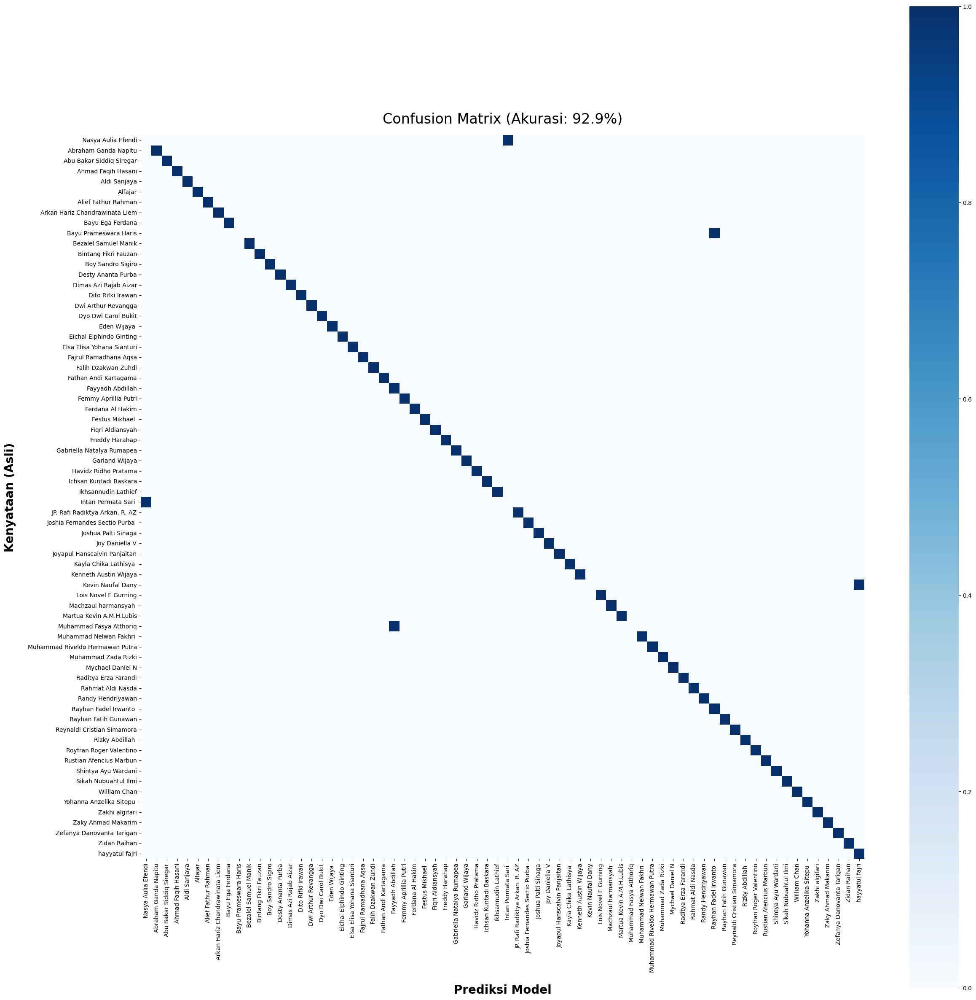

In [ ]:
# ---------------------------------------------------------
# CELL 7: EVALUASI PERFORMA & CONFUSION MATRIX
# ---------------------------------------------------------
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm

print("Memulai Evaluasi Menyeluruh pada Data Testing...")

# 1. KUMPULKAN SEMUA PREDIKSI
y_true = []
y_pred = []

model.eval() # Mode evaluasi (Matikan Dropout)

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="Evaluating"):
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())

# 2. HITUNG METRIK UTAMA
acc = accuracy_score(y_true, y_pred)
print(f"\n✅ AKURASI FINAL PADA DATA TEST: {acc*100:.2f}%")

# 3. CLASSIFICATION REPORT (Teks)
# Menampilkan Precision, Recall, F1-Score per mahasiswa
print("\n" + "="*60)
print("LAPORAN PER MAHASISWA (Cari yang F1-Score rendah)")
print("="*60)
# zero_division=0 agar tidak error jika ada kelas yang tidak muncul di test
print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))

# 4. VISUALISASI CONFUSION MATRIX (Gambar)
cm = confusion_matrix(y_true, y_pred)

# Atur ukuran gambar (Sangat Besar agar muat 70 nama)
plt.figure(figsize=(25, 25))

# Plot Heatmap
# annot=False supaya gambar tidak penuh angka (karena 70x70 kotak)
# cbar=False agar lebih luas
sns.heatmap(cm, annot=False, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names,
            square=True, cbar=True)

plt.xlabel('Prediksi Model', fontsize=20, labelpad=20, fontweight='bold')
plt.ylabel('Kenyataan (Asli)', fontsize=20, labelpad=20, fontweight='bold')
plt.title(f'Confusion Matrix (Akurasi: {acc*100:.1f}%)', fontsize=24, pad=20)

# Atur font nama mahasiswa di sumbu X dan Y agar terbaca
plt.xticks(rotation=90, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.tight_layout()
plt.show()

In [ ]:
# ---------------------------------------------------------
# CELL 8: SIMPAN MODEL (LOCAL & GOOGLE DRIVE BACKUP)
# ---------------------------------------------------------
import torch
import shutil
import os

print("=== MENYIMPAN MODEL ===")

# Nama file model final
MODEL_FILENAME = 'facenet_best_model.pth'

# 1. Simpan ke Local Colab (Sementara)
print(f"1. Menyimpan ke storage Colab: {MODEL_FILENAME}...")
torch.save(model.state_dict(), MODEL_FILENAME)

# 2. Backup ke Google Drive (Permanen)
# Kita taruh di folder yang sama dengan tempat Anda upload ZIP tadi
DRIVE_FOLDER = '/content/drive/MyDrive/Dataset_Wajah/'
DRIVE_PATH = os.path.join(DRIVE_FOLDER, MODEL_FILENAME)

print(f"2. Melakukan backup ke Google Drive: {DRIVE_FOLDER}...")

if os.path.exists(DRIVE_FOLDER):
    try:
        shutil.copy(MODEL_FILENAME, DRIVE_PATH)
        print(f"✅ SUKSES! Model aman tersimpan di Google Drive:")
        print(f"   📂 {DRIVE_PATH}")
    except Exception as e:
        print(f"❌ Gagal copy ke Drive: {e}")
else:
    print(f"⚠️ Folder Drive {DRIVE_FOLDER} tidak ditemukan. Membuat folder baru...")
    try:
        os.makedirs(DRIVE_FOLDER, exist_ok=True)
        shutil.copy(MODEL_FILENAME, DRIVE_PATH)
        print(f"✅ SUKSES! Model aman tersimpan di Google Drive.")
    except Exception as e:
        print(f"❌ Gagal membuat folder/copy ke Drive: {e}")

# 3. Cek Ukuran File
file_size = os.path.getsize(MODEL_FILENAME) / (1024 * 1024) # Convert ke MB
print(f"\nUkuran Model: {file_size:.2f} MB")
print("Siap digunakan untuk Aplikasi Streamlit/Web!")

=== MENYIMPAN MODEL ===
1. Menyimpan ke storage Colab: facenet_best_model.pth...
2. Melakukan backup ke Google Drive: /content/drive/MyDrive/Dataset_Wajah/...
✅ SUKSES! Model aman tersimpan di Google Drive:
   📂 /content/drive/MyDrive/Dataset_Wajah/facenet_best_model.pth

Ukuran Model: 90.08 MB
Siap digunakan untuk Aplikasi Streamlit/Web!


Mengumpulkan semua prediksi dari Data Testing...
Total Data Test: 70 foto


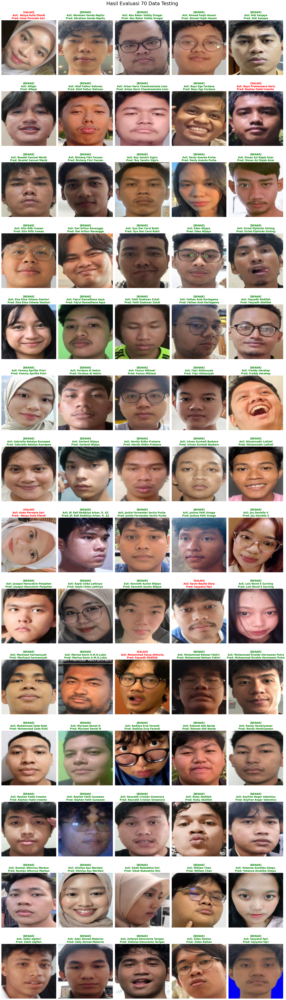

In [ ]:
# ---------------------------------------------------------
# CELL 9 FIX: VISUALISASI HASIL (METODE MIN-MAX SCALING)
# ---------------------------------------------------------
import math
import numpy as np
import matplotlib.pyplot as plt

def show_tensor_safe(tensor):
    """
    Mengubah Tensor (yang nilainya aneh/negatif) menjadi gambar
    yang bisa dilihat mata manusia dengan teknik Min-Max Scaling.
    """
    # 1. Clone & Pindah ke CPU & Ubah urutan dimensi (Channel di belakang)
    img = tensor.cpu().clone().permute(1, 2, 0).numpy()

    # 2. Geser nilai agar min = 0
    img = img - img.min()

    # 3. Skala nilai agar max = 1
    if img.max() > 0:
        img = img / img.max()

    return img

print("Mengumpulkan semua prediksi dari Data Testing...")

# 1. KUMPULKAN SEMUA DATA TEST
all_images = []
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        all_images.extend(inputs)
        all_preds.extend(preds)
        all_labels.extend(labels)

# Hitung jumlah total data test
num_samples = len(all_images)
print(f"Total Data Test: {num_samples} foto")

# 2. ATUR GRID GAMBAR
cols = 5
rows = math.ceil(num_samples / cols)

# Perbesar ukuran kanvas agar tulisan tidak tabrakan
plt.figure(figsize=(20, 5 * rows))

# 3. LOOPING MENAMPILKAN GAMBAR
for i in range(num_samples):
    ax = plt.subplot(rows, cols, i + 1)

    img_tensor = all_images[i]
    pred_idx = all_preds[i].item()
    true_idx = all_labels[i].item()

    true_name = class_names[true_idx]
    pred_name = class_names[pred_idx]

    # Warna Status
    is_correct = (pred_idx == true_idx)
    color_code = 'green' if is_correct else 'red'
    status_text = "[BENAR]" if is_correct else "[SALAH]"

    # --- BAGIAN PENTING: PAKAI FUNGSI BARU ---
    img_display = show_tensor_safe(img_tensor)
    plt.imshow(img_display)
    # -----------------------------------------

    # Judul
    title_text = f"{status_text}\nAsli: {true_name}\nPred: {pred_name}"
    plt.title(title_text, color=color_code, fontsize=12, fontweight='bold')

    plt.axis('off')

plt.tight_layout()
plt.suptitle(f"Hasil Evaluasi {num_samples} Data Testing", fontsize=24, y=1.005)
plt.show()

In [ ]:
# ---------------------------------------------------------
# CELL 10 FINAL: INFERENCE DENGAN MATEMATIKA YANG SAMA
# ---------------------------------------------------------
from PIL import Image, ImageOps
from facenet_pytorch import fixed_image_standardization
import torch.nn.functional as F
import matplotlib.pyplot as plt
import os
import torch

print("=== DEMO PENGUJIAN MODEL ===")

# --- INPUT PATH GAMBAR ---
IMAGE_PATH = '/content/botak.jpg' # <--- PATH ANDA
# -------------------------

# 1. SETUP MODEL
if 'model' not in locals():
    print("Memuat ulang model...")
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    # Pastikan num_classes sesuai dengan jumlah mahasiswa (misal 69 atau 70)
    model = InceptionResnetV1(pretrained=None, classify=True, num_classes=len(class_names))
    model.load_state_dict(torch.load('facenet_best_model.pth', map_location=device))
    model.to(device)
    model.eval()

def predict_custom_image(image_path):
    # Cek Path
    image_path = image_path.strip().replace("'", "").replace('"', "")
    if not os.path.exists(image_path):
        print(f"❌ Error: File tidak ditemukan di: {image_path}")
        return

    # A. Buka Gambar
    try:
        img = Image.open(image_path).convert('RGB')
        img = ImageOps.exif_transpose(img)
    except Exception as e:
        print(f"❌ Error membuka file: {e}")
        return

    # B. Deteksi Wajah (MTCNN Output = Tensor 0-255)
    face_tensor = mtcnn(img)

    if face_tensor is None:
        print("❌ Wajah tidak terdeteksi! Coba foto lain.")
        plt.imshow(img)
        plt.axis('off')
        plt.show()
        return

    # C. REPLIKASI LOGIKA TRAINING (PENTING!)

    # 1. Samakan dengan transforms.ToTensor()
    # Mengubah range 0-255 menjadi 0-1
    face_tensor = face_tensor / 255.0

    # 2. Samakan dengan fixed_image_standardization
    # Rumus FaceNet: (input - 127.5) / 128.0
    # Karena input training kita "kecil" (0-1), maka kita lakukan hal yang sama di sini
    face_input = fixed_image_standardization(face_tensor)

    # Tambah dimensi batch
    face_input = face_input.unsqueeze(0).to(device)

    # D. Prediksi
    with torch.no_grad():
        logits = model(face_input)
        probabilities = F.softmax(logits, dim=1)

    conf, idx = torch.max(probabilities, 1)
    conf_score = conf.item() * 100
    pred_name = class_names[idx.item()]

    # E. Tampilkan
    # Un-normalize manual untuk display agar gambar bagus dilihat
    display_img = face_tensor.permute(1, 2, 0).cpu().numpy()

    plt.figure(figsize=(6, 6))
    plt.imshow(display_img)

    status_color = 'green' if conf_score > 60 else 'red'
    status_text = "YAKIN" if conf_score > 60 else "RAGU"

    plt.title(f"Prediksi: {pred_name}\n({status_text} - {conf_score:.1f}%)",
              color=status_color, fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.show()

    print(f"\n--- Top 3 Kemungkinan ---")
    probs_top3, idx_top3 = torch.topk(probabilities, 3)
    for i in range(3):
        p = probs_top3[0][i].item() * 100
        n = class_names[idx_top3[0][i].item()]
        print(f"{i+1}. {n:<30} : {p:.2f}%")

# Jalankan
predict_custom_image(IMAGE_PATH)

In [ ]:
# Simpan daftar nama kelas ke file txt
with open('class_names.txt', 'w') as f:
    for name in class_names:
        f.write(f"{name}\n")

print("File 'class_names.txt' berhasil dibuat!")
print("Silakan DOWNLOAD file ini dan file 'facenet_best_model.pth' ke laptop Anda.")

File 'class_names.txt' berhasil dibuat!
Silakan DOWNLOAD file ini dan file 'facenet_best_model.pth' ke laptop Anda.
